In [3]:
from util_NTEPmodel import NTEPModel

In [4]:
# Load the already fitted model
m = NTEPModel(load_file='model_04-feb-2024-distinct_taus (rater_severity)')

/home/hok/oxb_econ/stan-env/util/util_NTEPmodel.py:64: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['DATE'] = pd.to_datetime(df['DATE'])


Loaded data from ../data/quality_nj2.csv
Loaded model from ../model/model_04-feb-2024-distinct_taus (rater_severity)


In [ ]:
# Or sample the model, and then save it
m = NTEPModel(num_basis_functions = 8,            # 8 by default
                        stan_file = 'model_04-feb-2024-distinct_taus.stan', # (some predetermined filepath) by default
                        data_file = 'quality_nj2.csv', # nj2 dataset by default
                        pred_N = 100,                         # 100 by default
                        padding = 5,)                         # 5 by default
m.sample()
m.save(file='model_04-feb-2024-distinct_taus (rater_severity)')

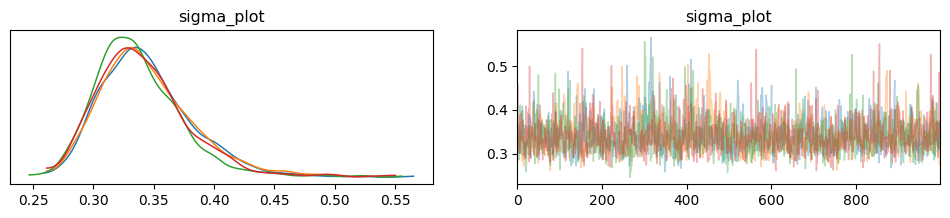

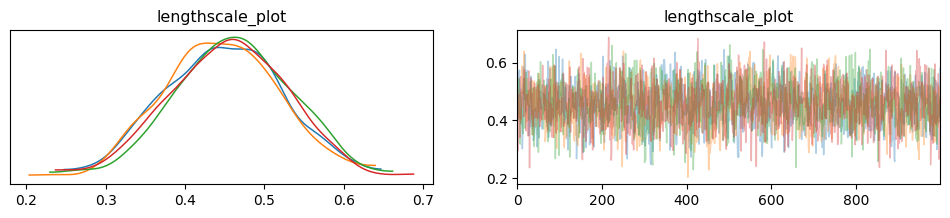

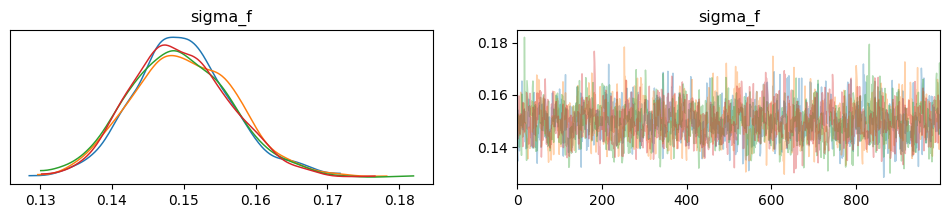

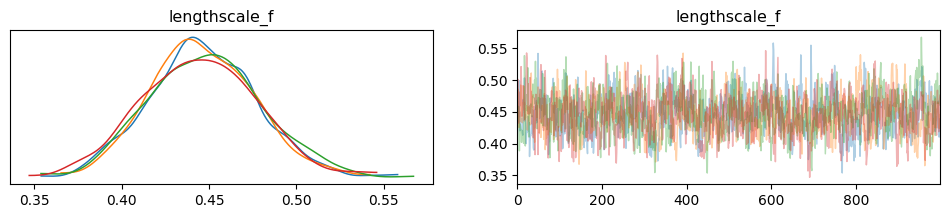

In [5]:
# check the model's convergence
m.plot_trace()

/root/.cache/pypoetry/virtualenvs/stan-env-Zdpe4cqc-py3.10/lib/python3.10/site-packages/arviz/plots/traceplot.py:222: UserWarning:

rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (56), generating only 20 plots



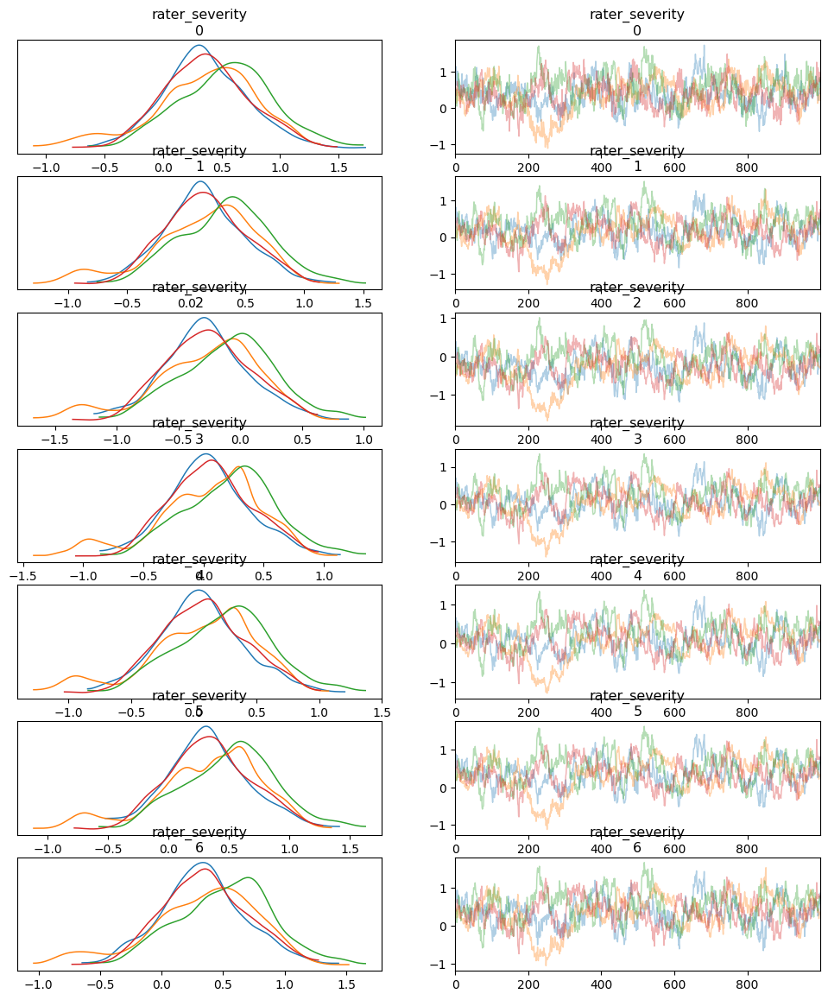

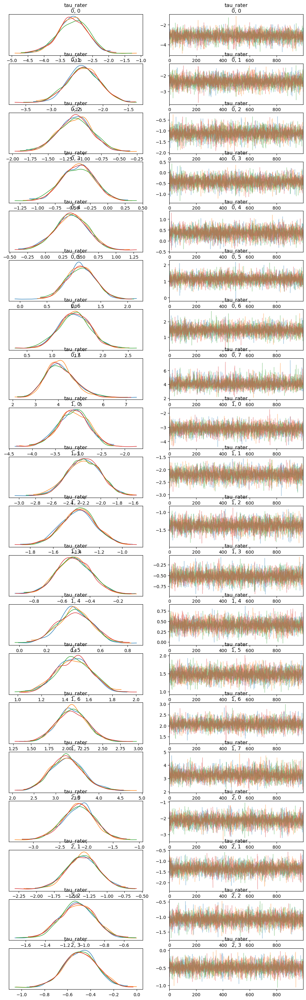

In [20]:
# Plot specific variables with plot_trace
m.plot_trace(var_names=['rater_severity','tau_rater'])

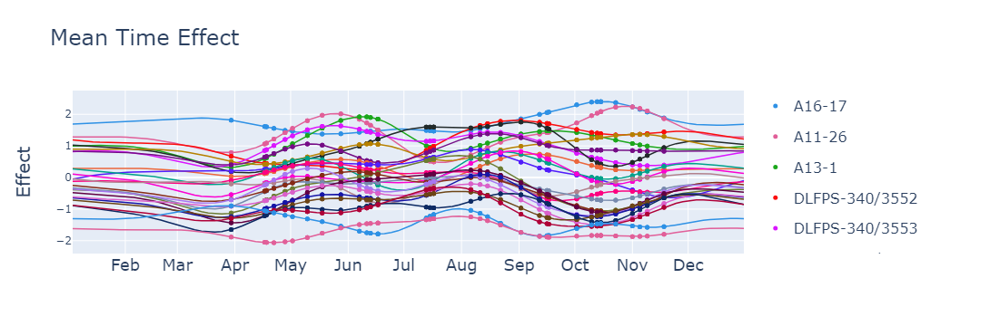

In [9]:
# 
m.plot_time_effect()

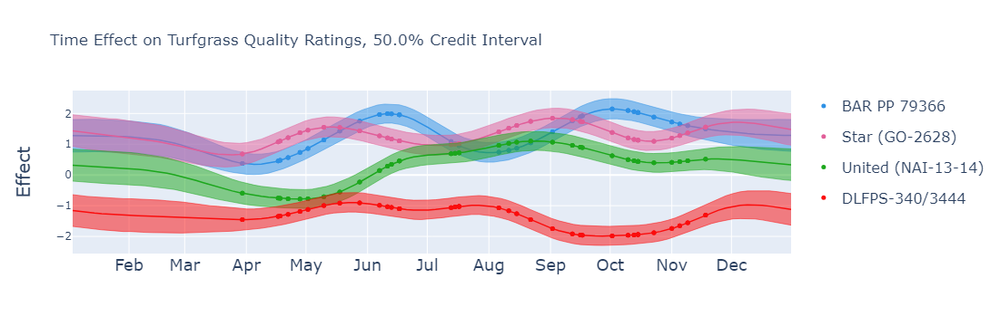

In [17]:
m.plot_time_effect(entries=4, # plot N random entries
                   credit_interval = 0.5, # credit interval
                   sort_entries = 'data', # sort methods, accepts:  'unsorted', 'weighted', 'annual', 'data'
                                        # data ranks by average of the points where we have taken ratings
                                        # annual ranks by all predicted point
                                        # weighted (default) uses all predicted points, but weights them according to the standard deviation of samples
                                        # predictions near data points are weighted more heavily
                  )

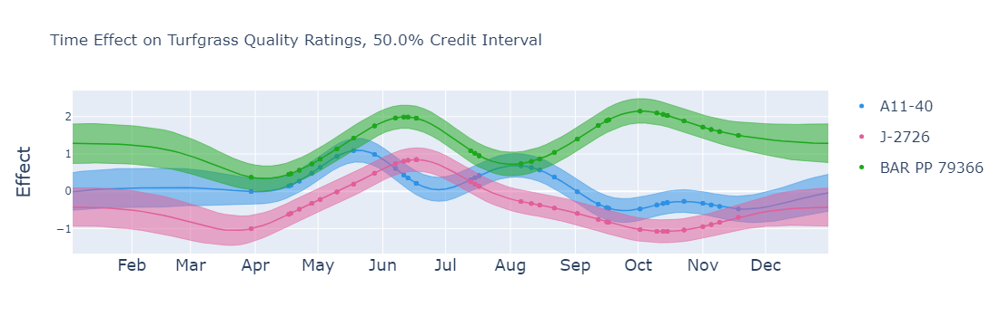

In [15]:
m.plot_time_effect(entries=['A11-40', 'J-2726','BAR PP 79366'], # plot the list of entries you want
                   credit_interval = 0.5, # credit interval
                   sort_entries = 'unsorted', # unsorted to keep them in the order listed initially
                  )

In [18]:
m.loo()

Computed from 4000 posterior samples and 9612 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -15102.35    72.93
p_loo      773.52        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     9610  100.0%
 (0.5, 0.7]   (ok)          2    0.0%
   (0.7, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%

/root/.cache/pypoetry/virtualenvs/stan-env-Zdpe4cqc-py3.10/lib/python3.10/site-packages/arviz/plots/traceplot.py:222: UserWarning:

rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (56), generating only 20 plots



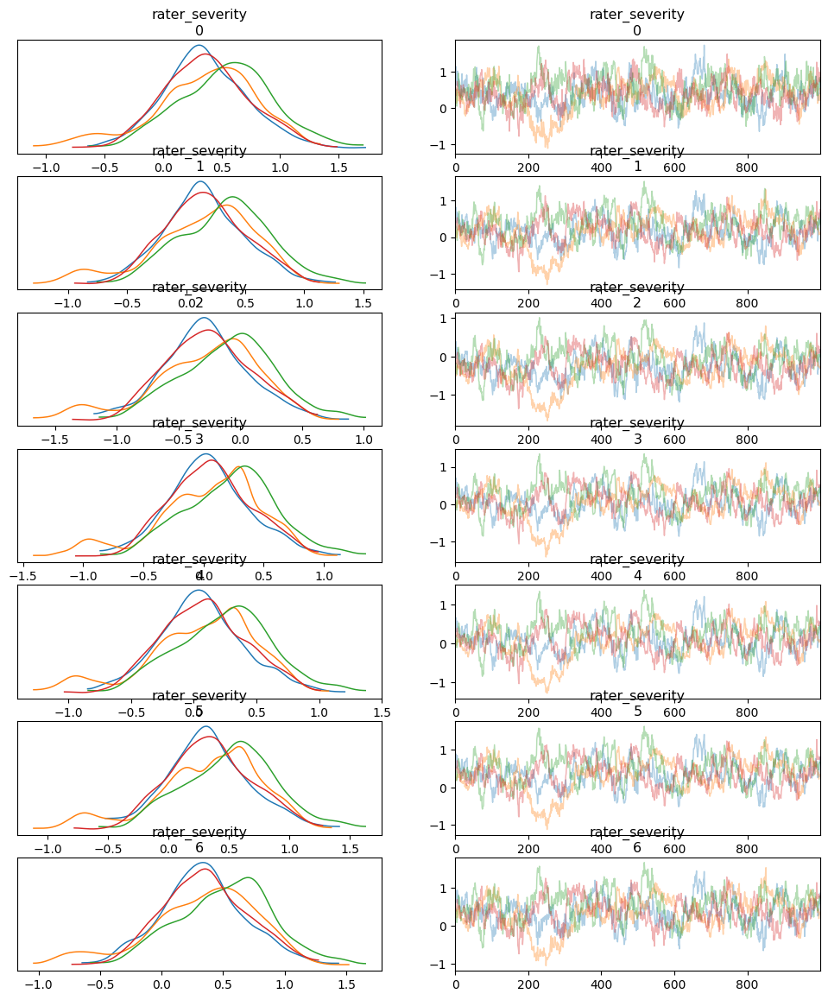

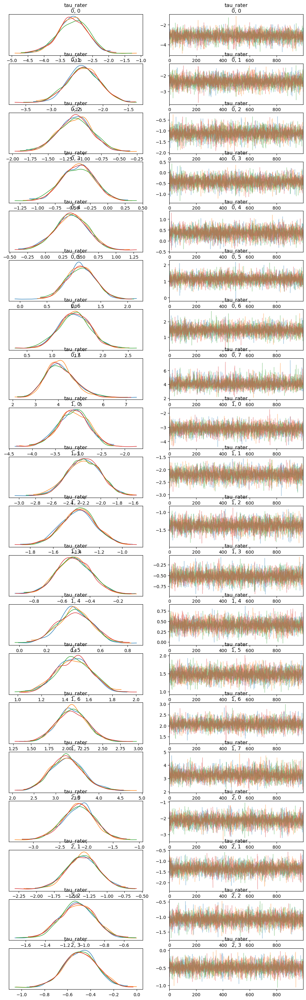

In [19]:
m.plot_trace(var_names=['rater_severity','tau_rater'])

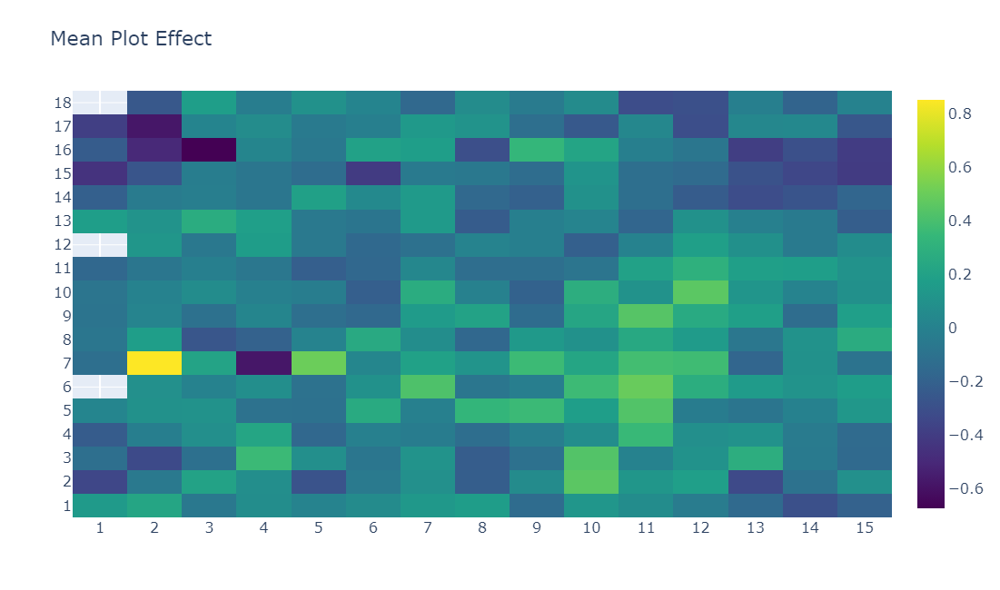

In [23]:
m.plot_plot_effect()

DAS
JEN
PLV
RMD
RON
SAB
WAM


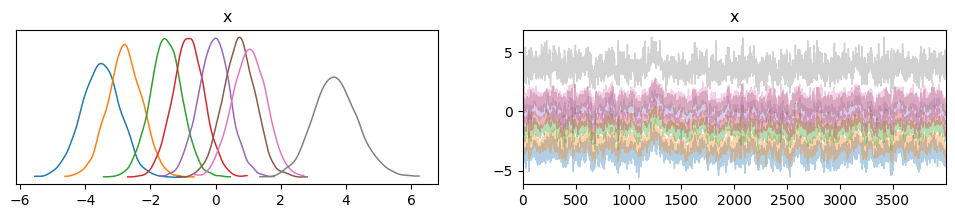

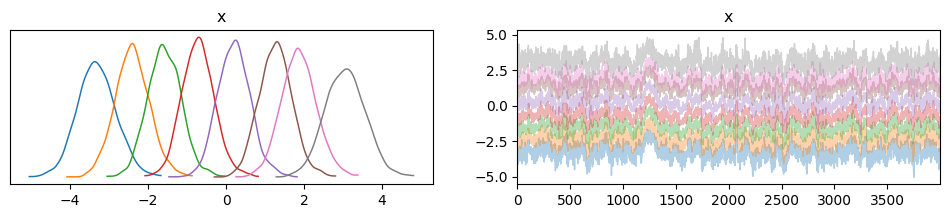

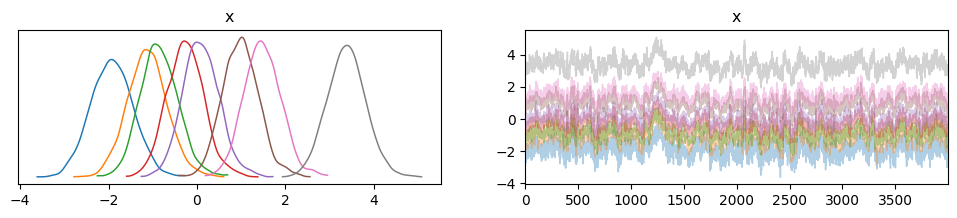

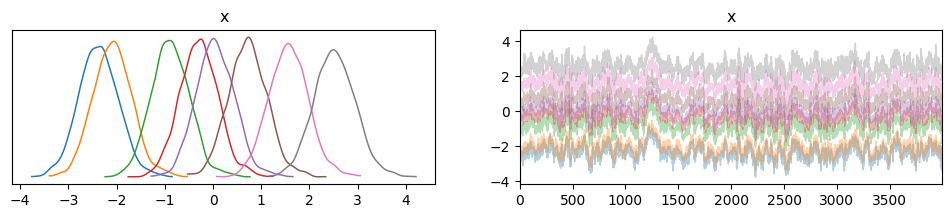

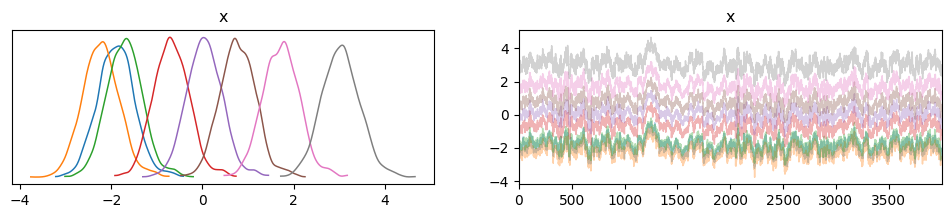

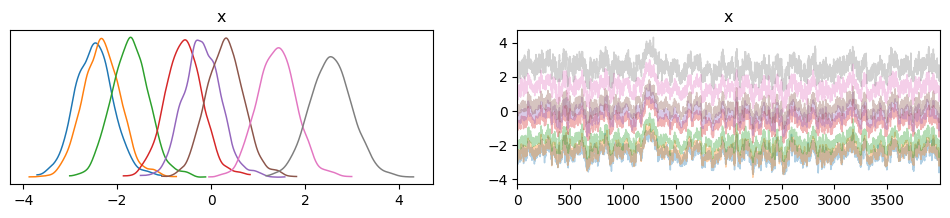

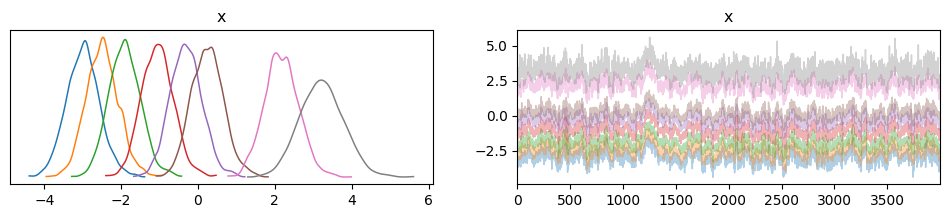

In [21]:
# scrap code, probably wont be used 
import arviz as az
rater_codes = dict(m.df.groupby('RATER')['RATER_CODE'].mean().apply(lambda x: round(x)))
inv_rater_codes = {}
for key in rater_codes.keys(): inv_rater_codes[rater_codes[key]] = key
for i in range(7):
    print(inv_rater_codes[i])
    az.plot_trace(m.fit.tau_rater[:,i,:].T - m.fit.rater_severity[:,i].T,compact=False)

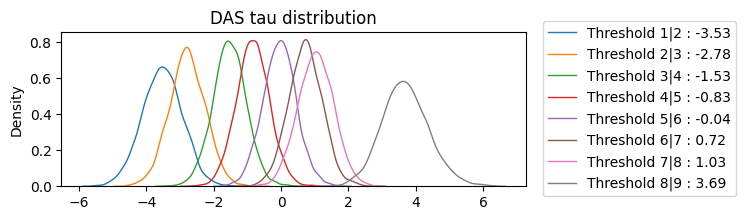

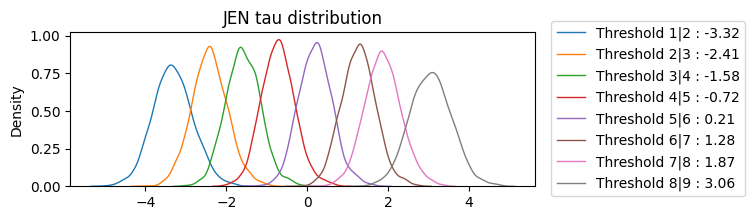

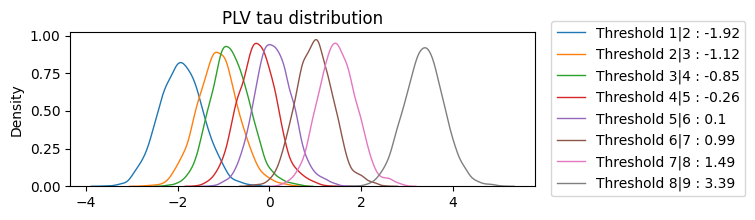

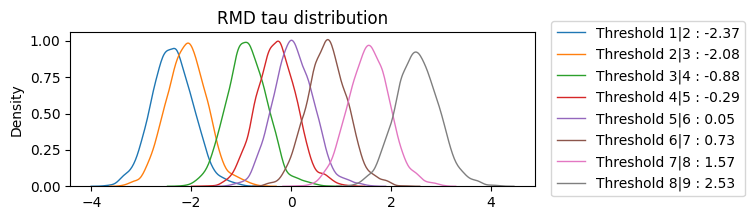

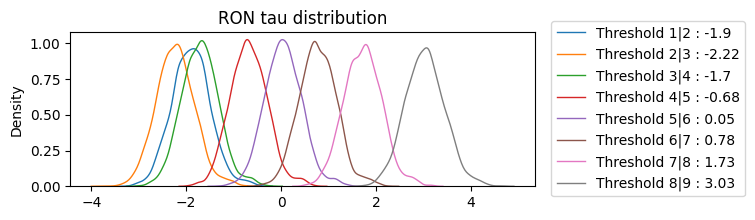

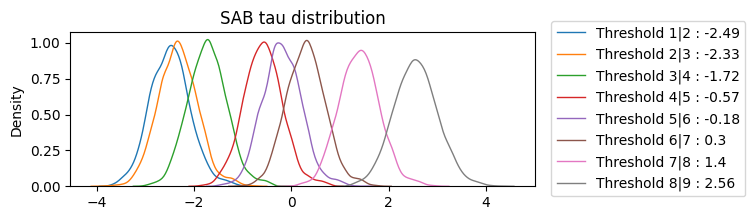

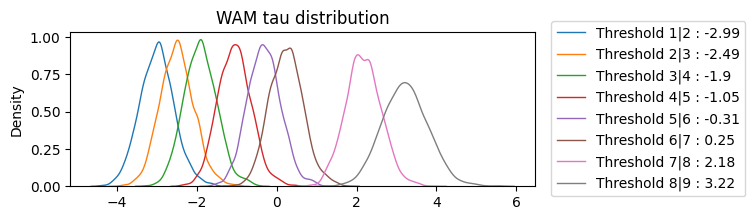

In [23]:
# might turn this into a function in the utility file, but not sure.
import seaborn as sns
import matplotlib.pyplot as plt

for i in range(7):
    plt.figure(figsize=(6, 2)) 
    for j in range(8):
        sample_data = (m.fit.tau_rater[:,i,:].T - m.fit.rater_severity[:,i].T)[j]
        sns.kdeplot(sample_data, linewidth=1, label="Threshold "+str(j+1)+"|"+str(j+2)+" : "+str(round(sample_data.mean(),2)))
    plt.title(inv_rater_codes[i]+" tau distribution")
    plt.legend(bbox_to_anchor=(1.02, 1.12))
    plt.show()

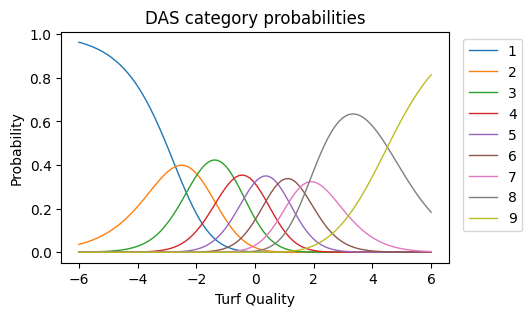

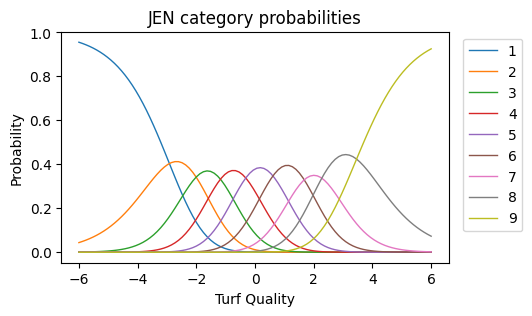

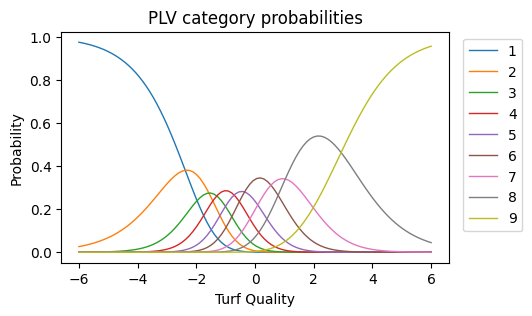

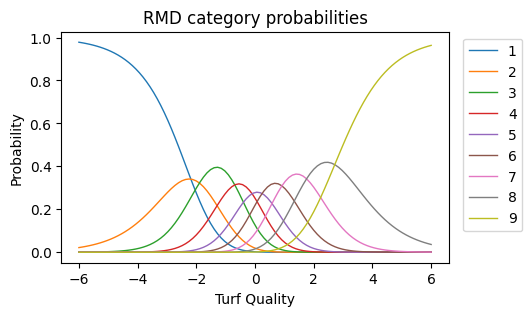

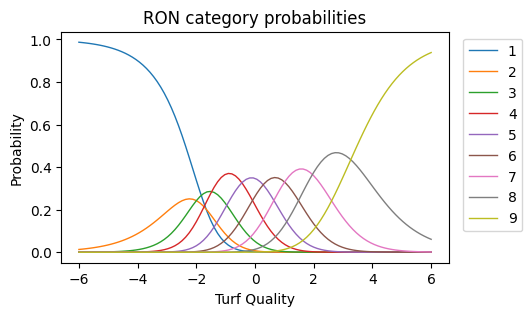

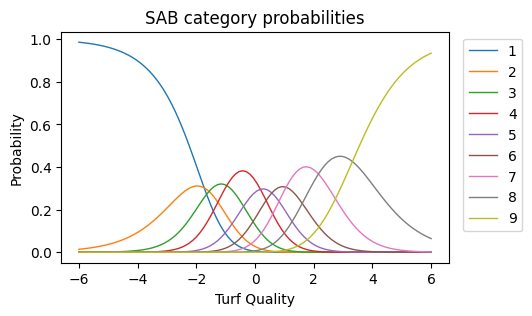

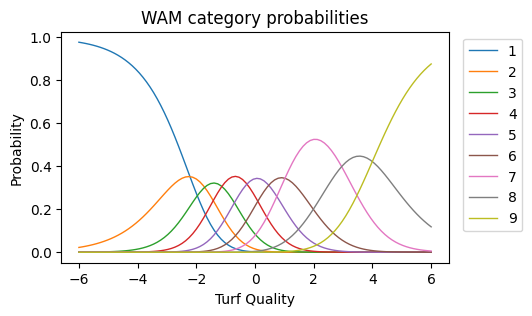

In [28]:
from scipy.special import softmax
import numpy as np
import pandas as pd

def rsm_probability(y, theta, beta, tau):
    unsummed = np.concatenate(([0], theta - beta - tau))
    #print(unsummed)
    probs = softmax(np.cumsum(unsummed))
    return probs[y]

for r in range(7):
    plt.figure(figsize=(5, 3)) 
    tau = list((m.fit.tau_rater[:,r,:].T).mean(axis=1))
    beta = m.fit.rater_severity[:,r].T.mean()
    for i in range(9):
        plt.plot(np.linspace(-6,6,100), [rsm_probability(i,theta,beta,tau) for theta in np.linspace(-6,6,100)], linewidth=1, label=str(i+1))
        #plt.vlines((tau-m.fit.rater_severity[:,1].T.mean())[i],ymin=0, ymax=1)
        plt.title(inv_rater_codes[r]+" category probabilities")
        plt.xlabel('Turf Quality')
        plt.ylabel('Probability')
        plt.legend(bbox_to_anchor=(1.02, 1))
    plt.show()

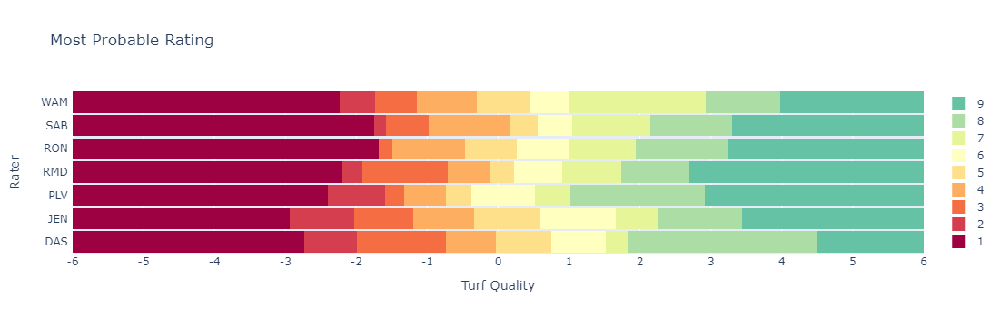

In [29]:
from scipy.optimize import bisect

import plotly.graph_objects as go
import plotly.express as px

lb = -6
ub = 6
resolution = 100
colors = px.colors.diverging.Spectral

x_space = np.linspace(lb,ub,resolution)
x_data = []

for r in range(7):
    tau = list((m.fit.tau_rater[:,r,:].T).mean(axis=1))
    beta = m.fit.rater_severity[:,r].T.mean()
    boundaries = []
    for i in range(8):
        def probability_difference(x):
            return rsm_probability(i+1,x,beta,tau) - rsm_probability(i,x,beta,tau)
        #plt.plot(x_space, [probability_difference(theta) for theta in x_space], linewidth=1, label=str(i+1))
        boundaries.append(bisect(probability_difference,lb,ub))
    stacks = [boundaries[0]-lb]
    for i in range(1,8):
        stacks.append(max(0,boundaries[i]-max(boundaries[:i])))
    stacks.append(max(0,ub-max(boundaries)))
    x_data.append(stacks)
    #print(sum(stacks))
    #print(stacks)
    #print(boundaries)
x_data = np.array(x_data).T
y_data = [inv_rater_codes[i]+" " for i in range(7)]
fig = go.Figure()

for i in range(9):
    fig.add_trace(go.Bar(
        y=y_data,
        x=x_data[i],
        name=str(i+1),
        orientation='h',
        marker=dict(
            color=colors[i],
            line=dict(color=colors[i], width=3)
        )
    ))

fig.update_layout(barmode='stack',
                  title='Most Probable Rating',
                  xaxis=dict(title='Turf Quality', range=[0, ub-lb],
                              ticktext=[str(i) for i in range(lb,ub+1)],
                             tickvals=list(range(0, ub-lb+1))),
                  yaxis=dict(title='Rater', automargin=True),)
fig.show()

In [30]:
tau = list((m.fit.tau_rater[:,6,:].T + m.fit.rater_severity[:,6].T).mean(axis=1))
tau

[-2.216699624117125,
 -1.7160588466171247,
 -1.129739534117125,
 -0.27592723836712496,
 0.466234549609875,
 1.019674337632875,
 2.950291075882875,
 3.995733265882875]

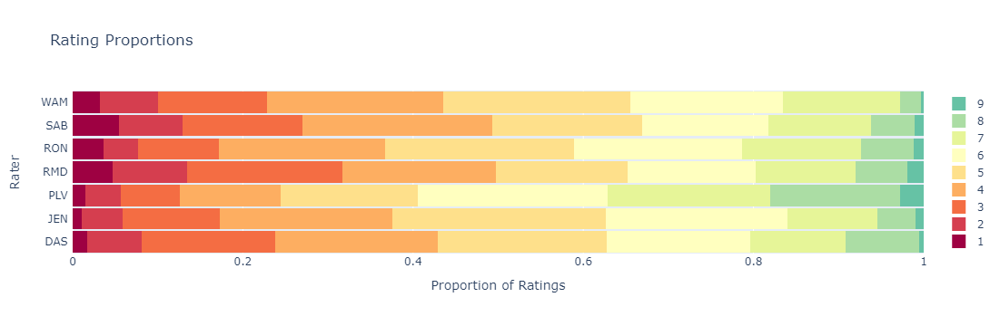

In [33]:
import numpy as np

df = m.df

table = pd.pivot_table(df[['PLT_ID','RATER_CODE','QUALITY']], aggfunc='count',index='QUALITY',columns='RATER_CODE',values='QUALITY')
for i in range(7): table[i] = table[i]/sum(table[i])

y_data = [inv_rater_codes[i]+" " for i in range(7)]
fig = go.Figure()

for i in range(9):
    fig.add_trace(go.Bar(
        y=y_data,
        x=table.loc[i+1],
        name=str(i+1),
        orientation='h',
        marker=dict(
            color=colors[i],
            line=dict(color=colors[i], width=3)
        )
    ))

fig.update_layout(barmode='stack',
                  title='Rating Proportions',
                  xaxis=dict(title='Proportion of Ratings', range=[0,1]),
                  yaxis=dict(title='Rater', automargin=True),)
fig.show()

In [34]:
table.loc[1]

RATER_CODE
0    0.018727
1    0.012484
2    0.016230
3    0.048689
4    0.037453
5    0.055556
6    0.033708
Name: 1, dtype: float64

In [35]:
df.groupby('QUALITY')['RATER_CODE'].count()

QUALITY
1     356
2     566
3    1167
4    1864
5    1937
6    1754
7    1286
8     578
9     104
Name: RATER_CODE, dtype: int64

In [36]:
import pandas as pd
pd.pivot_table(df[['PLT_ID','RATER_CODE','QUALITY']], aggfunc='count',index='QUALITY',columns='RATER_CODE',values='QUALITY')

RATER_CODE,0,1,2,3,4,5,6
QUALITY,,,,,,,
1,5,10,13,65,120,89,54
2,17,38,34,116,131,121,109
3,42,92,55,244,303,225,206
4,51,162,95,241,626,358,331
5,53,201,129,207,713,282,352
6,45,171,179,201,633,237,288
7,30,85,153,156,448,194,220
8,23,36,122,81,196,81,39
9,1,6,21,24,34,15,3


In [37]:
for i in range(7):
    table[i] = table[i]/sum(table[i])
table

RATER_CODE,0,1,2,3,4,5,6
QUALITY,,,,,,,
1,0.018727,0.012484,0.016230,0.048689,0.037453,0.055556,0.033708
2,0.063670,0.047441,0.042447,0.086891,0.040886,0.075531,0.068040
3,0.157303,0.114856,0.068664,0.182772,0.094569,0.140449,0.128589
4,0.191011,0.202247,0.118602,0.180524,0.195381,0.223471,0.206617
5,0.198502,0.250936,0.161049,0.155056,0.222534,0.176030,0.219725
6,0.168539,0.213483,0.223471,0.150562,0.197566,0.147940,0.179775
7,0.112360,0.106117,0.191011,0.116854,0.139825,0.121099,0.137328
8,0.086142,0.044944,0.152310,0.060674,0.061174,0.050562,0.024345
9,0.003745,0.007491,0.026217,0.017978,0.010612,0.009363,0.001873
